In [66]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.image import pad_to_bounding_box
from tensorflow.image import central_crop
from tensorflow.image import resize

In [67]:
bgd=image.load_img('dogs.png')

In [70]:
image.img_to_array(bgd).shape  #높이 너비 채널 
bgd_vector = np.asarray(image.img_to_array(bgd))

(1157, 1148, 3)

In [69]:
bgd_vector = bgd_vector /255 #정규화 처리해서 이미지 작업함
# 정규화 -> 데이터의 범위 차이가 많을때 공통된 범위로 만들어줌
# 표준화 -> 평균이 0, 표준편차 1 이 되도록 만들어주는것 
bgd_vector

array([[[0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        ...,
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549]],

       [[0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        ...,
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549]],

       [[0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        ...,
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549]],

       ...,

       [[0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        ...,
        [0.972549, 0.972549, 0.972549],
        [0.972549, 0.972549, 0.972549],
        [

In [17]:
bgd_vector.shape   # -> 채널 = 3 은 컬러는 3 흑백은 1

(1157, 1148, 3)

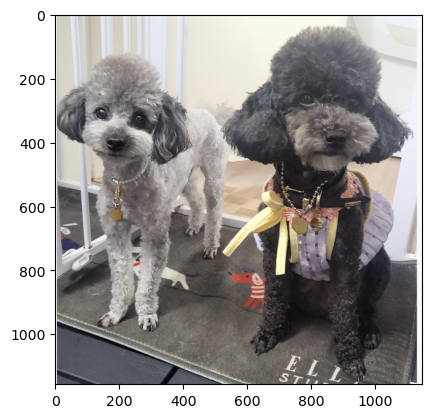

In [18]:
plt.imshow(bgd_vector)
plt.show()

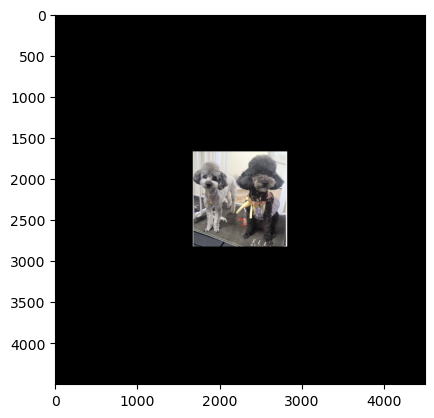

In [19]:
#이미지의 변경할 크기 설정 
target_height = 4500
target_width = 4500
 
#현재 이미지의 크기 지정 
source_height = bgd_vector.shape[0]
source_width = bgd_vector.shape[1]
 
#padding 실시 : pad_to_bounding_box 사용 
bgd_vector_pad = pad_to_bounding_box(bgd_vector, 
                                     int((target_height-source_height)/2), 
                                     int((target_width-source_width)/2), 
                                     target_height, 
                                     target_width)
                                     
 #이미지 형태 확인 
bgd_vector_pad.shape
 
#이미지 확인 
plt.imshow(bgd_vector_pad)
plt.show()

#이미지 저장 
image.save_img('dogs_pad.png', bgd_vector_pad)

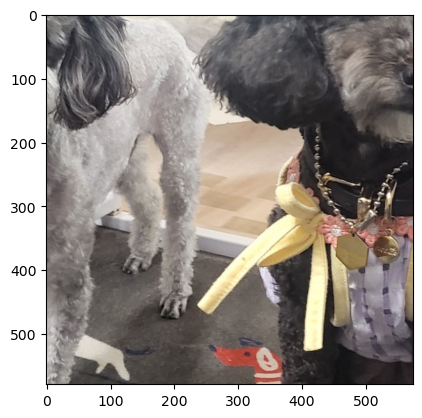

In [20]:
#가운데를 중심으로 50%만 crop 
bgd_vector_crop = central_crop(bgd_vector, .5)
 
bgd_vector_crop.shape
 
plt.imshow(bgd_vector_crop)
plt.show()

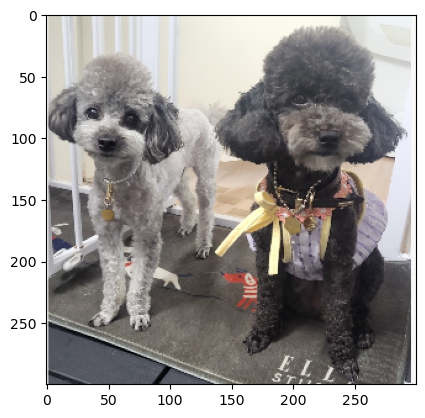

In [21]:
#크기 조절 
bgd_vector_resize = resize(bgd_vector, (300,300))
 
bgd_vector_resize.shape
 
plt.imshow(bgd_vector_resize)

In [22]:
#사전학습 모델 불러오기 : 케라스에서 클래스 형태로 제공함 
from tensorflow.keras.applications.vgg16 import VGG16
#from tensorflow.keras.applications. 이후에 모델 선택해서 다른거로 해도 됨 

#weight, include_top 파라미터 설정 
model = VGG16(weights='imagenet', include_top=True)
model.summary()

553467096/553467096 [==============================] - 82s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

In [23]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
 
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.applications.imagenet_utils import preprocess_input
import numpy as np
 
img = Image.open('dogs.png')

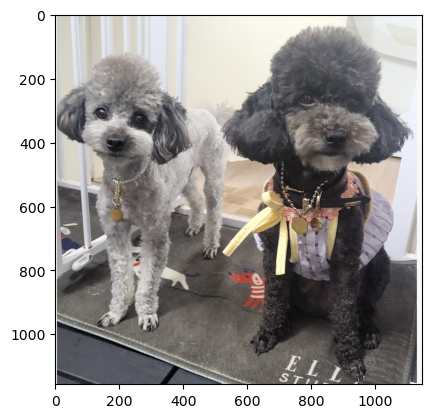

In [25]:
img
plt.imshow(np.asarray(img))

In [26]:
img.size

(1148, 1157)

In [27]:
w, h = img.size
s = min(w, h)

In [28]:
y = (h - s) // 2
x = (w - s) // 2

In [29]:
y

4

In [30]:
print(w, h, x, y, s)


1148 1157 0 4 1148


In [31]:
img = img.crop((x, y, x+s, y+s)) #이미지의 일부분 잘래낼때 사용, 크기 맞추기위해 

In [32]:
img.size

(1148, 1148)

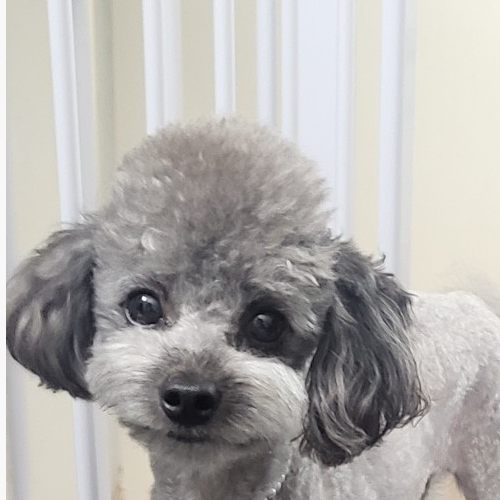

In [35]:
img.crop((0,0,500,500))

In [36]:
#이미지넷 대회에서 사용되어지는 모델의 사이즈이고 이 크기에 맞춰줘야 이미지가들어감
#대회 모델을 가져와서 쓰는것이므로
model.layers[0].input_shape

[(None, 224, 224, 3)]

In [37]:
target_size = 224
img = img.resize((target_size, target_size))

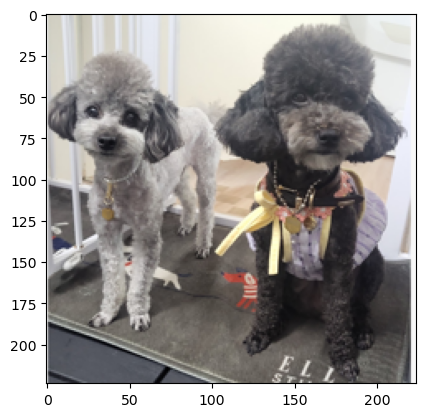

In [38]:
plt.imshow(np.asarray(img))

In [39]:
np_img = image.img_to_array(img)
np_img.shape  #(224, 224, 3)

(224, 224, 3)

In [40]:
img_batch = np.expand_dims(np_img, axis=0)  #차원을 추가할때 사용
img_batch.shape  # -> 이미지가 1장 이래서 1,224,224,3 이다

(1, 224, 224, 3)

In [41]:
pre_processed = preprocess_input(img_batch)

In [42]:
y_preds = model.predict(pre_processed)
 
y_preds.shape  # 종속변수가 취할 수 있는 값의 수 = 1000
 
np.set_printoptions(suppress=True, precision=10)
y_preds
 
#가장 확률이 높은 값
np.max(y_preds)

1/1 [==============================] - 0s 279ms/step


0.78416103

In [43]:
decode_predictions(y_preds, top=10) # 78프로확률로 토이푸들 나옴

35363/35363 [==============================] - 0s 1us/step


[[('n02113624', 'toy_poodle', 0.78416103),
  ('n02113712', 'miniature_poodle', 0.16782114),
  ('n02096437', 'Dandie_Dinmont', 0.01923898),
  ('n02093647', 'Bedlington_terrier', 0.016176438),
  ('n02113799', 'standard_poodle', 0.012043098),
  ('n02097047', 'miniature_schnauzer', 8.5362444e-05),
  ('n02105641', 'Old_English_sheepdog', 8.354024e-05),
  ('n02086240', 'Shih-Tzu', 7.7943914e-05),
  ('n02085936', 'Maltese_dog', 1.9853807e-05),
  ('n02106382', 'Bouvier_des_Flandres', 1.9203428e-05)]]

In [45]:
 decode_predictions(y_preds, top=100)

[[('n02113624', 'toy_poodle', 0.78416103),
  ('n02113712', 'miniature_poodle', 0.16782114),
  ('n02096437', 'Dandie_Dinmont', 0.01923898),
  ('n02093647', 'Bedlington_terrier', 0.016176438),
  ('n02113799', 'standard_poodle', 0.012043098),
  ('n02097047', 'miniature_schnauzer', 8.5362444e-05),
  ('n02105641', 'Old_English_sheepdog', 8.354024e-05),
  ('n02086240', 'Shih-Tzu', 7.7943914e-05),
  ('n02085936', 'Maltese_dog', 1.9853807e-05),
  ('n02106382', 'Bouvier_des_Flandres', 1.9203428e-05),
  ('n04409515', 'tennis_ball', 1.868509e-05),
  ('n02097474', 'Tibetan_terrier', 1.8551922e-05),
  ('n02102318', 'cocker_spaniel', 1.7055856e-05),
  ('n02091635', 'otterhound', 1.6971322e-05),
  ('n02105505', 'komondor', 1.6934411e-05),
  ('n02096051', 'Airedale', 1.6143942e-05),
  ('n02098413', 'Lhasa', 1.4873319e-05),
  ('n04399382', 'teddy', 9.317822e-06),
  ('n01817953', 'African_grey', 8.614159e-06),
  ('n02108551', 'Tibetan_mastiff', 8.345857e-06),
  ('n03803284', 'muzzle', 5.8178794e-06),
  

In [ ]:
"""
이미지 증식 : 부족한 이미지 대체하기 위해서
"""

In [46]:
image = Image.open('dogs.png').resize((500, 400))

In [47]:
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

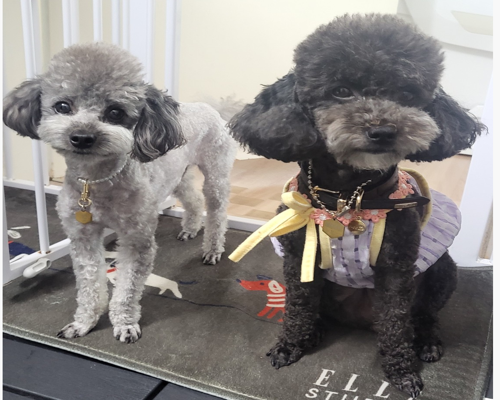

In [48]:
image

In [50]:
image_tensor.shape

(400, 500, 3)

In [ ]:
#train = 20명 * 10장 이미지(대한민국)
#test = 20명 * 3장 이미지(대한민국)
#번호 부여 : 0번 ~ 20번 -> 원핫 인코딩 

#이미지 증식 ( 가능하면 )
#-성능 비교
#-다양한 증식
#-증식된 파일 저장 
#ex) train = 20명 * 10장 = 200장
#1장당 회전/반전/... ->5장으로 증식
#5*200  = 1000 -> test데이터는 증식 ㄴㄴ ,train데이터만 증식가능
#1000장 -> cnn -> 모델 -> test 진행 -> 정확도 
#카페에 업로드 : 정확도 기재

#너비 500 높이 150

#트레인 데이터 =train_150.jpg ~ train_159.jpg   ->xtrain=(200,500,150,3), ytrain=(200,20) ->이미지 하나당 20차원이래서 ?
#test = test_045.jpg ~ test_047.jpg   ->xtest(60,500,150,3), ytest=(60,20)
#정답은 15로 레이블링 
#xtrain, ytrain data 구성 -> CNN 모델 -> xtest -> yred 와 ytest를 비교하여 성능 출력(해상도 맞춰야함)
그림판에 대한민국 텍스트 이미지를 13장 생성(500,150)으로 크기 설정
크기가 다르더라도 resize함수를 이용해 설정 가능 
cnn 모델 생성 -> validation 데이터 없이 실행 


In [ ]:
# Flip, 반전

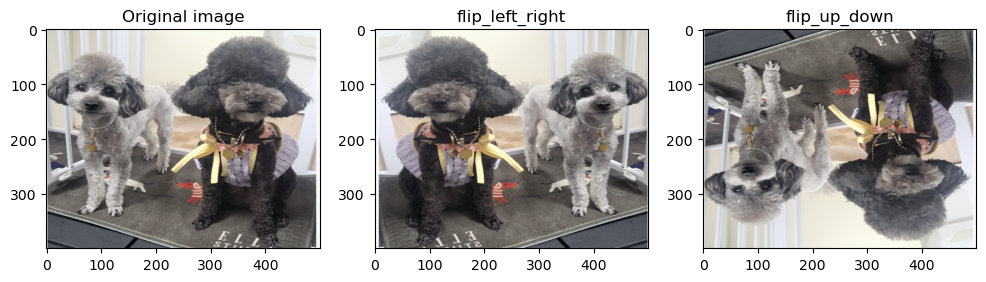

In [51]:
#이미지 증식 , 좌우반전, 상하 반전
flip_lr_tensor = tf.image.flip_left_right(image_tensor)
flip_ud_tensor = tf.image.flip_up_down(image_tensor)
flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)


plt.figure(figsize=(12,12))

plt.subplot(1,3,1)
plt.title('Original image')
plt.imshow(image)

plt.subplot(1,3,2)
plt.title('flip_left_right')
plt.imshow(flip_lr_image)

plt.subplot(1,3,3)
plt.title('flip_up_down')
plt.imshow(flip_ud_image)

plt.show()

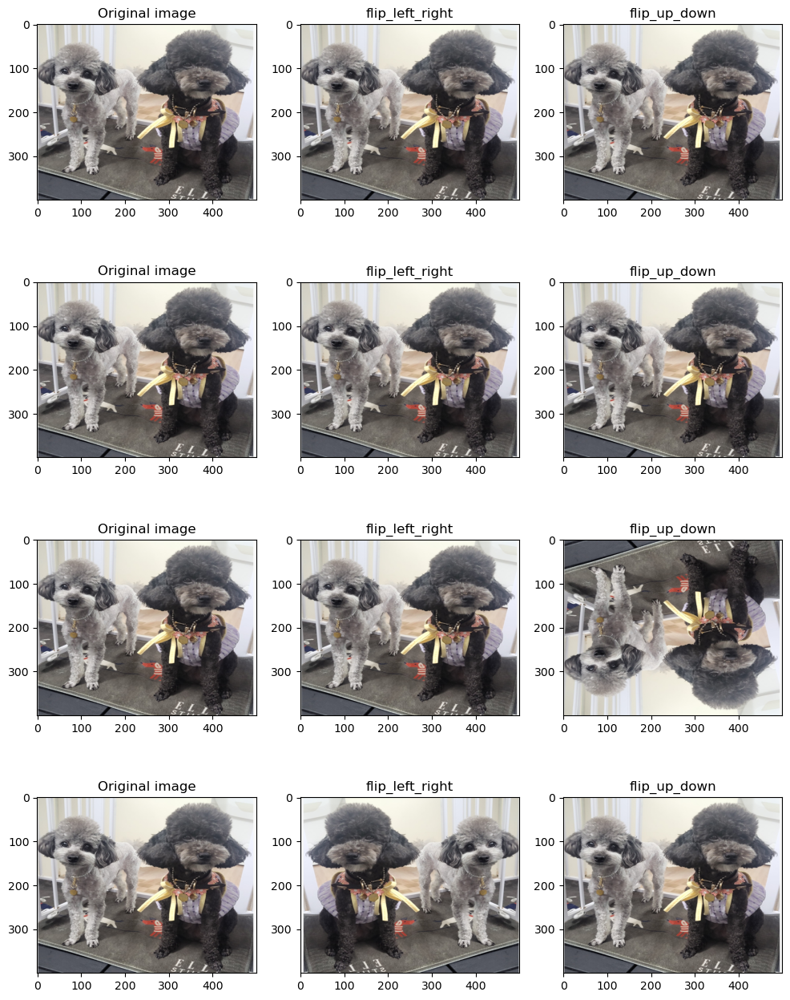

In [52]:
plt.figure(figsize=(12,16))

row = 4
for i in range(row):
  flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
  flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
  flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
  flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

  plt.subplot(4,3, i*3+1)
  plt.title('Original image')
  plt.imshow(image)

  plt.subplot(4,3,i*3+2)
  plt.title('flip_left_right')
  plt.imshow(flip_lr_image)

  plt.subplot(4,3,i*3+3)
  plt.title('flip_up_down')
  plt.imshow(flip_ud_image)

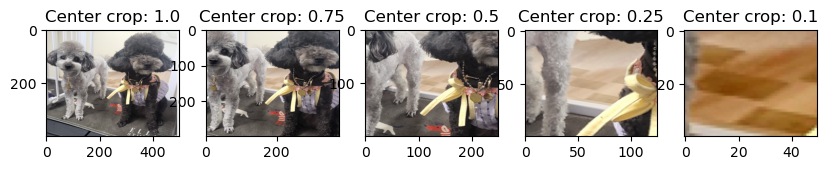

In [53]:
# 얼마나 확대를 할건지
plt.figure(figsize=(12,15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
  cropped_tensor = tf.image.central_crop(image_tensor, frac)
  cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

  plt.subplot(1, col+1, i+1)
  plt.title(f'Center crop: {frac}')
  plt.imshow(cropped_img)

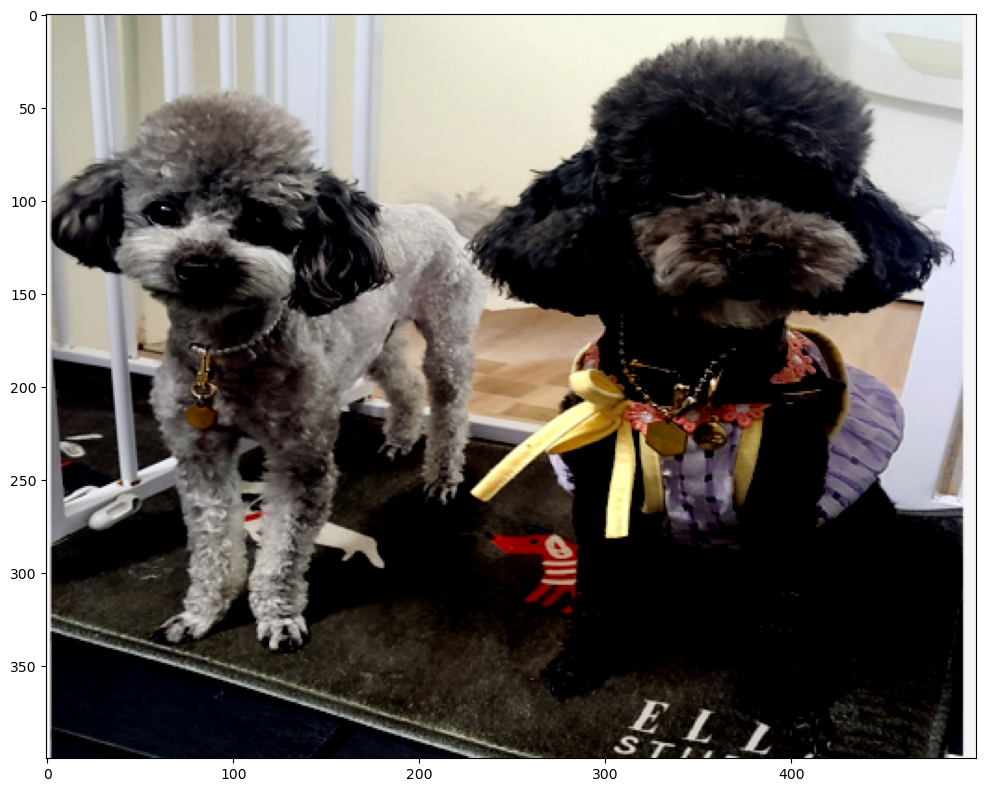

In [55]:
# 이미지 밝게 어둡게 설정 
plt.figure(figsize=(12, 15))

random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

plt.imshow(random_bright_image)
plt.show()

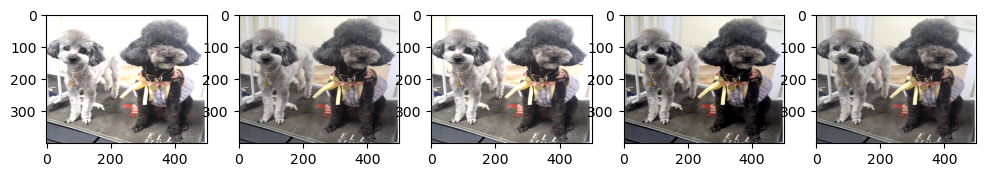

In [56]:
plt.figure(figsize=(12,15))

for i in range(5):
  random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)   # 최대가 128, 0~128사이 값으로 랜덤하게 밝기 선택
  random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
  random_bright_image = tf.keras.preprocessing.image.array_to_img(random_bright_tensor)

  plt.subplot(1, 5, i+1)
  plt.imshow(random_bright_image)

In [57]:
pip install albumentations

   ---------------------------------------- 0.0/125.7 kB ? eta -:--:--
   ---------------------------------------  122.9/125.7 kB 7.5 MB/s eta 0:00:01
   ---------------------------------------- 125.7/125.7 kB 2.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/38.0 MB ? eta -:--:--
    --------------------------------------- 0.9/38.0 MB 27.5 MB/s eta 0:00:02
   - -------------------------------------- 1.0/38.0 MB 32.3 MB/s eta 0:00:02
   - -------------------------------------- 1.7/38.0 MB 18.1 MB/s eta 0:00:03
   --- ------------------------------------ 3.4/38.0 MB 24.0 MB/s eta 0:00:02
   ------ --------------------------------- 5.9/38.0 MB 34.2 MB/s eta 0:00:01
   ------ --------------------------------- 6.3/38.0 MB 31.1 MB/s eta 0:00:02
   --------- ------------------------------ 9.4/38.0 MB 37.6 MB/s eta 0:00:01
   ------------- -------------------------- 12.6/38.0 MB 59.5 MB/s eta 0:00:01
   ---------------- ----------------------- 15.7/38.0 MB 72.6 MB/s eta 0:0

In [64]:
import numpy as np
image = Image.open('dogs.png').resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)
image_arr.shape

(300, 400, 3)

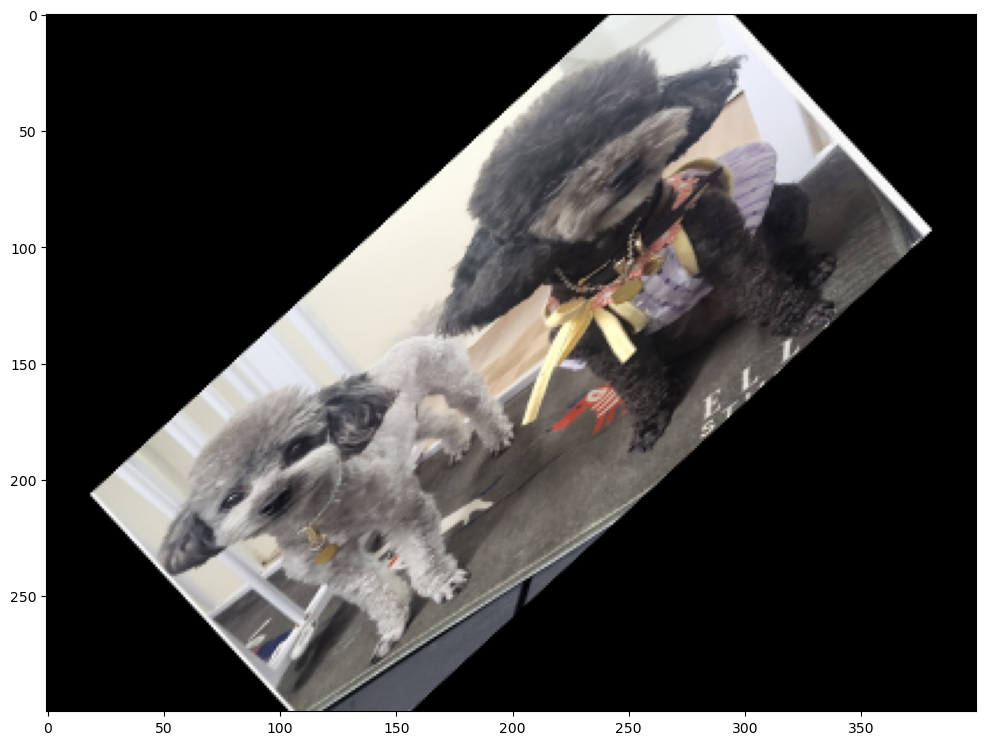

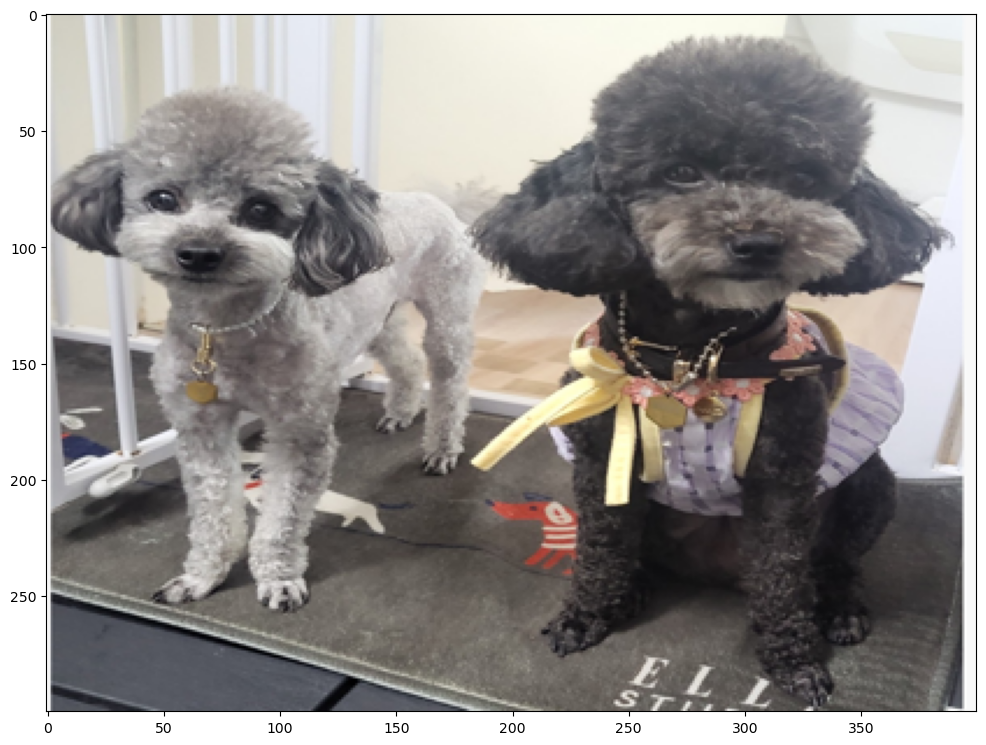

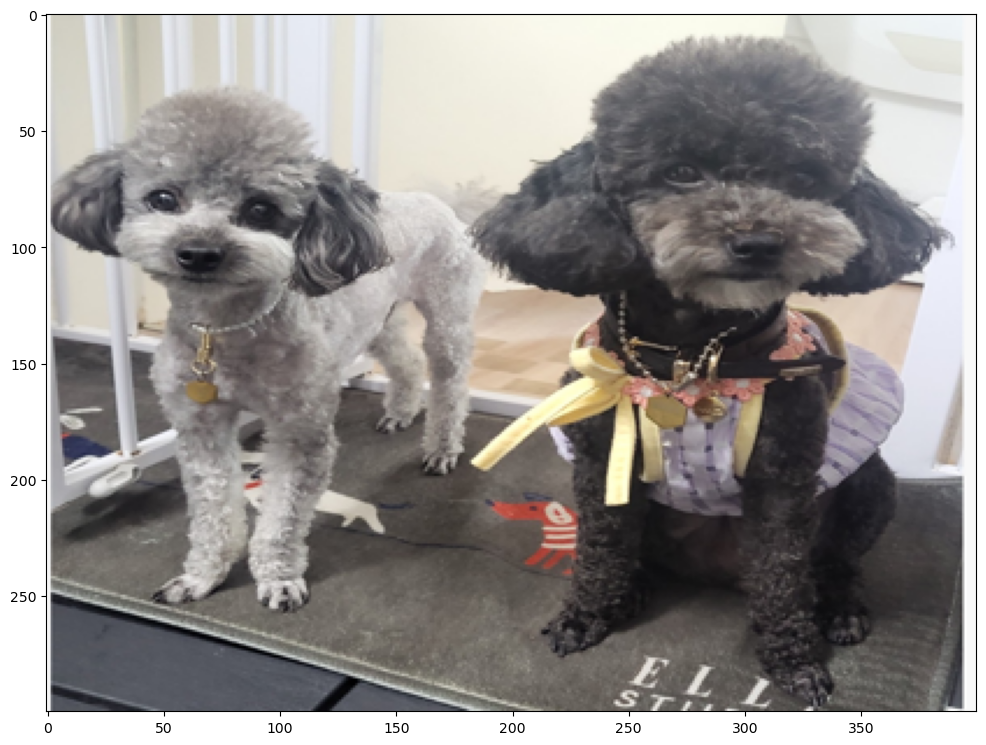

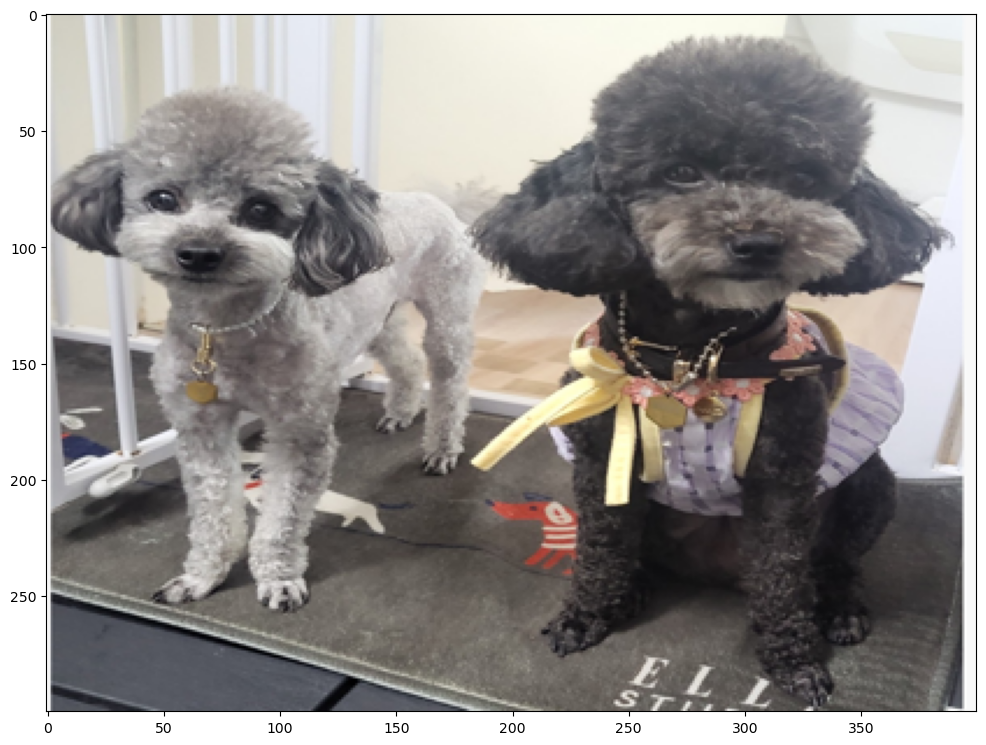

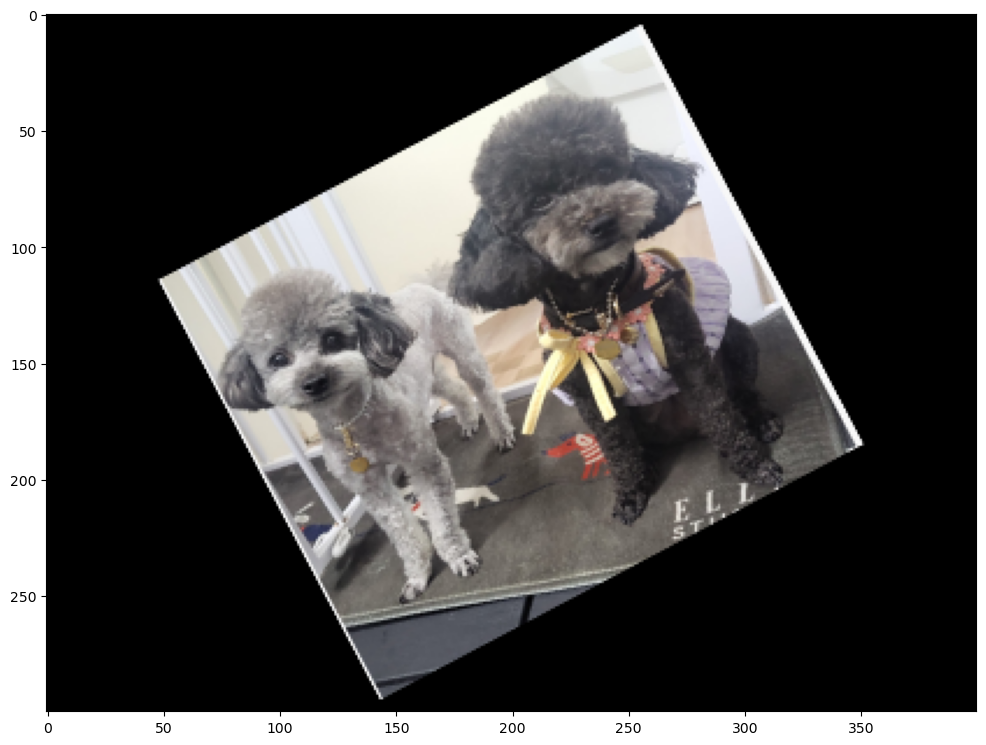

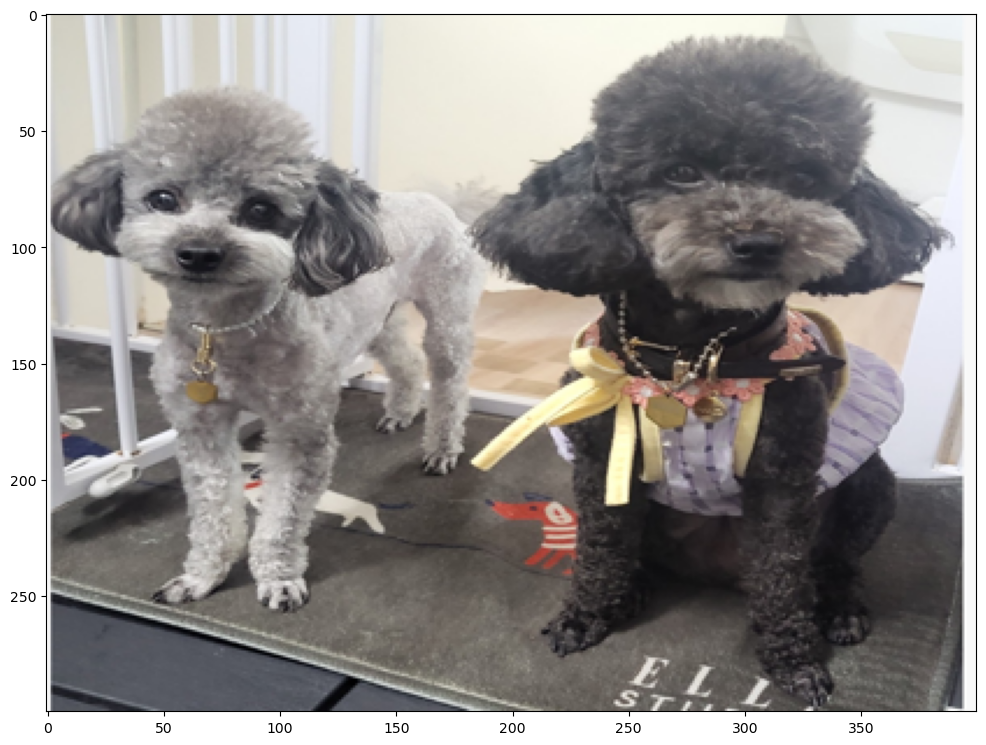

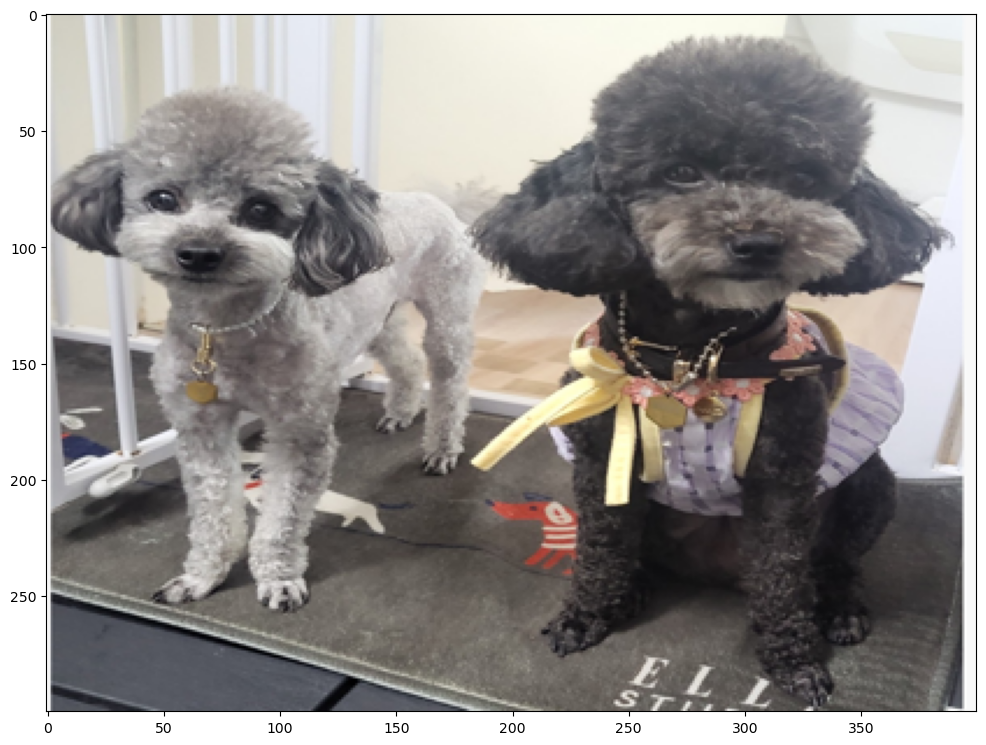

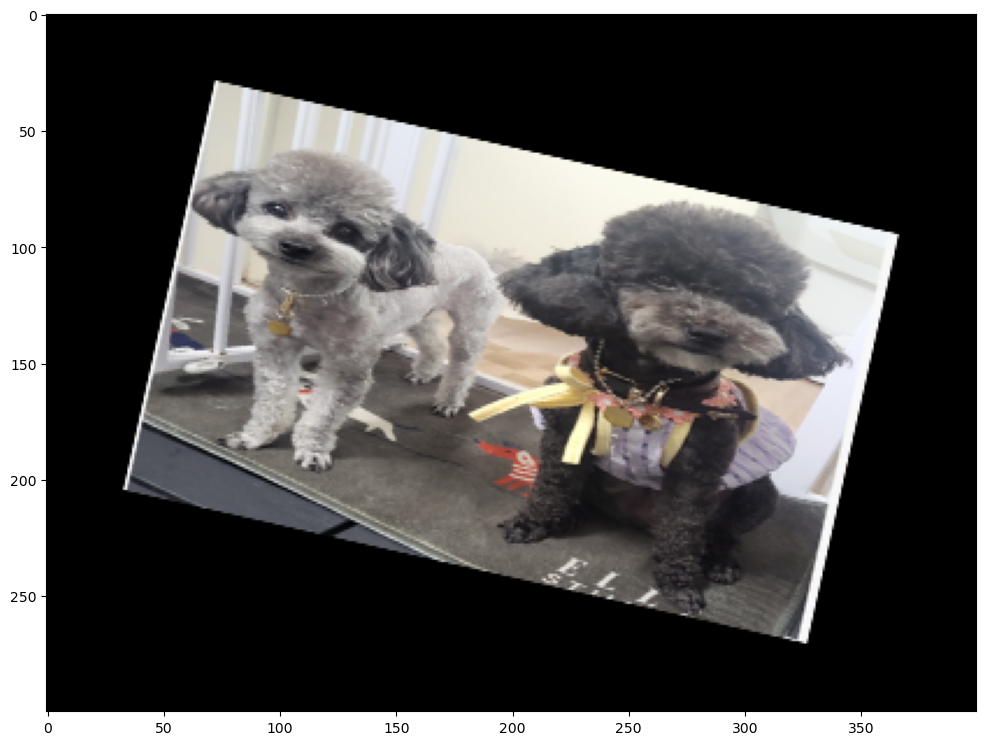

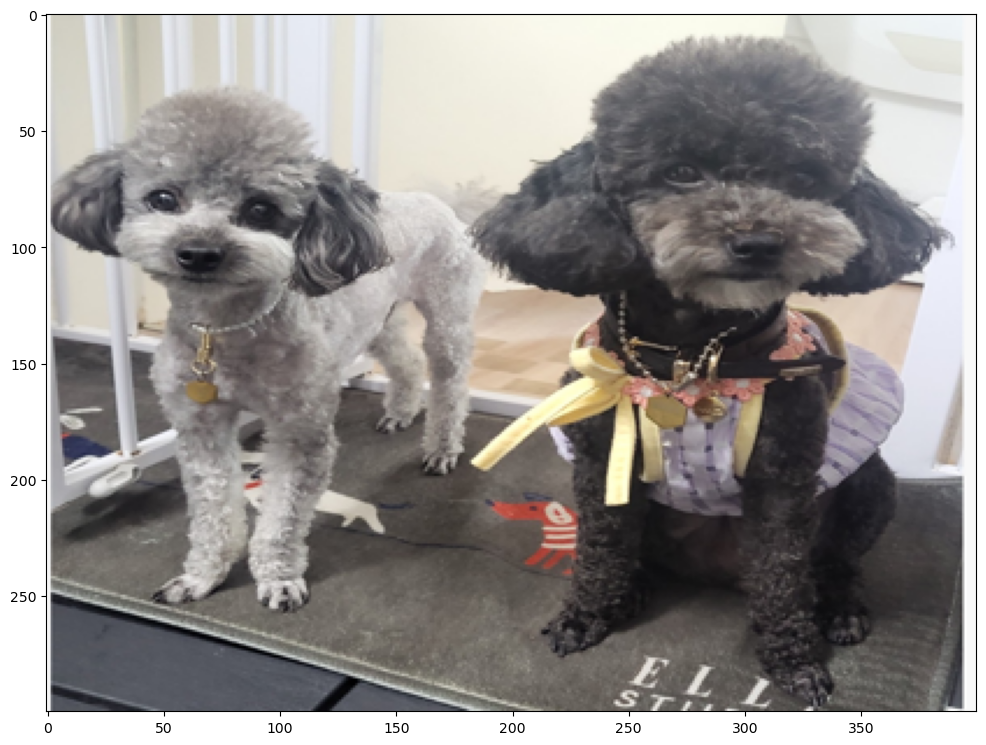

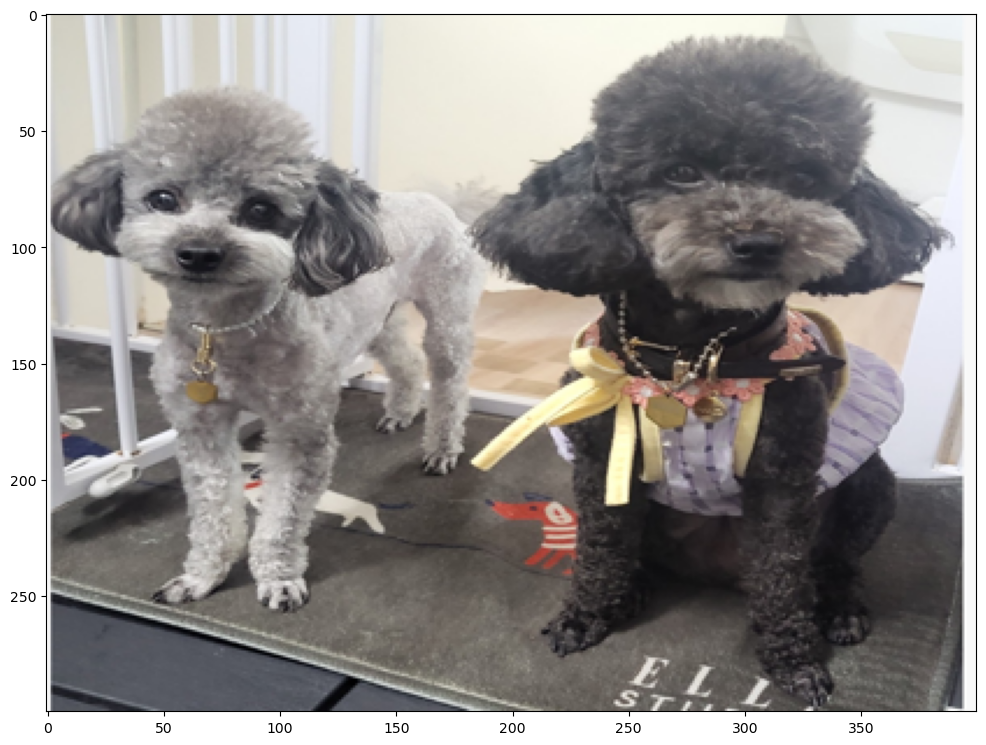

In [65]:
import albumentations as A

for i in range(10):
    transform = A.Compose([
      A.Affine(rotate=(-45,45), scale=(0.5,0.9), p=0.5)
    ])
    transformed = transform(image=image_arr)
    plt.figure(figsize=(12,12))
    plt.imshow((transformed['image']))
    plt.show()

In [ ]:
"""

"""